In [1]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

C:\Users\ThinkPad\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [20]:
import json
import xml.etree.ElementTree as ET
import PIL

In [11]:
def convert_cvat_to_coco(xml_file, output_json):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    
    coco_format = {
        "images": [],
        "annotations": [],
        "categories": [
            {"id": 1, "name": "Shoreline", "supercategory": "Polyline"}
        ],
    }
    
    annotation_id = 1
    for image in root.findall("image"):
        image_id = int(image.attrib["id"])
        coco_format["images"].append({
            "id": image_id,
            "file_name": image.attrib["name"],
            "width": int(image.attrib["width"]),
            "height": int(image.attrib["height"])
        })
        
        for polyline in image.findall("polyline"):
            points = polyline.attrib["points"]
            # Convert points to COCO segmentation-like format
            point_list = []
            for point in points.split(";"):
                x, y = map(float, point.split(","))
                point_list.extend([x, y])
            
            coco_format["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": 1,
                "segmentation": [point_list],  # Single polyline in segmentation
                "iscrowd": 0
            })
            annotation_id += 1

    # Save as COCO JSON
    with open(output_json, "w") as f:
        json.dump(coco_format, f, indent=4)

#Example usage:
convert_cvat_to_coco("work_abeg.xml", "shoreline_test_run_coco.json")

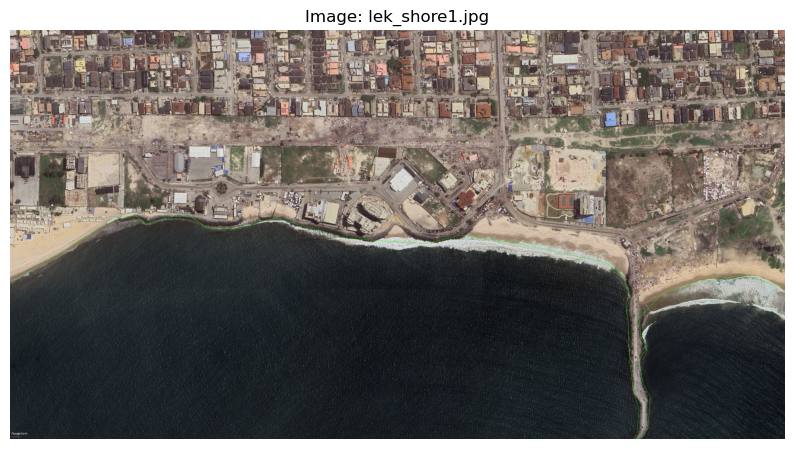

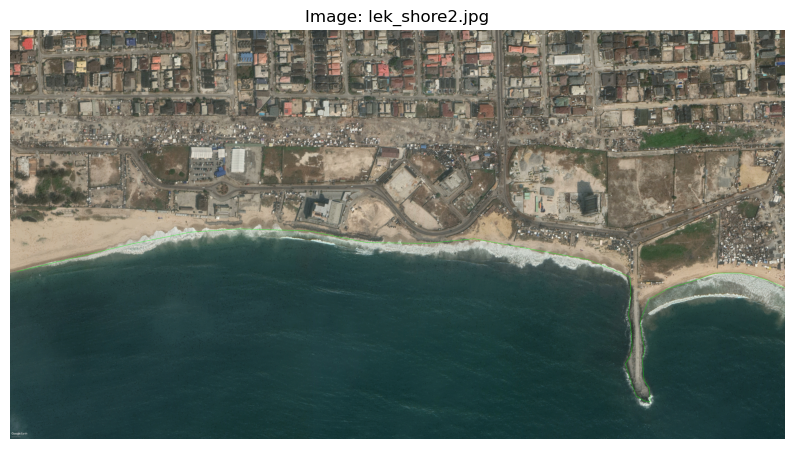

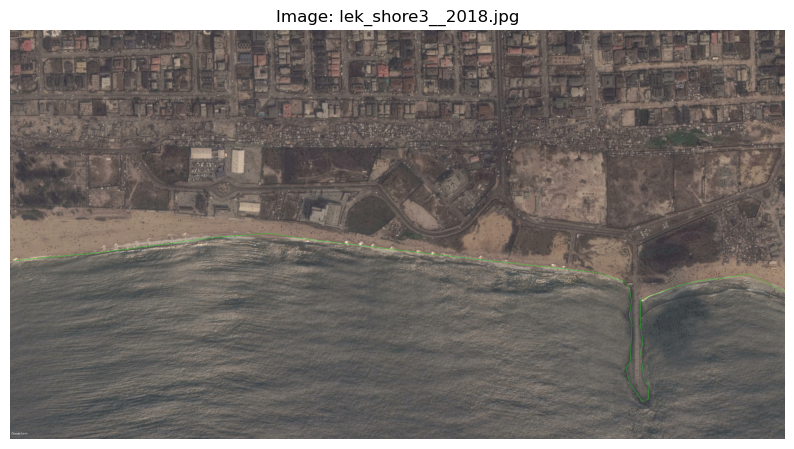

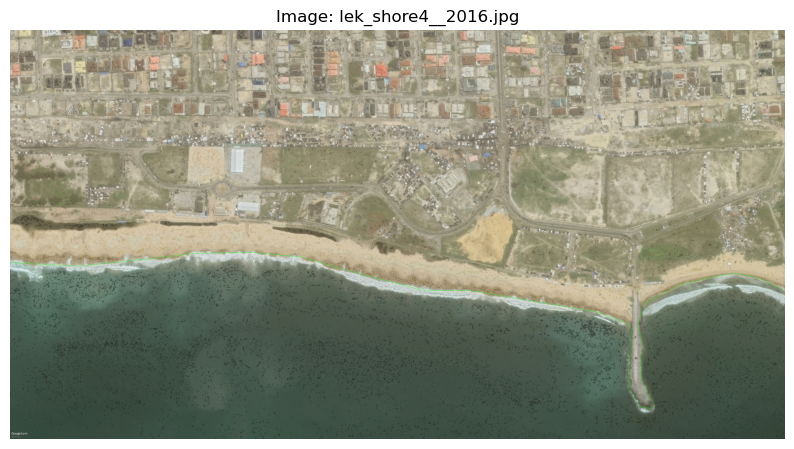

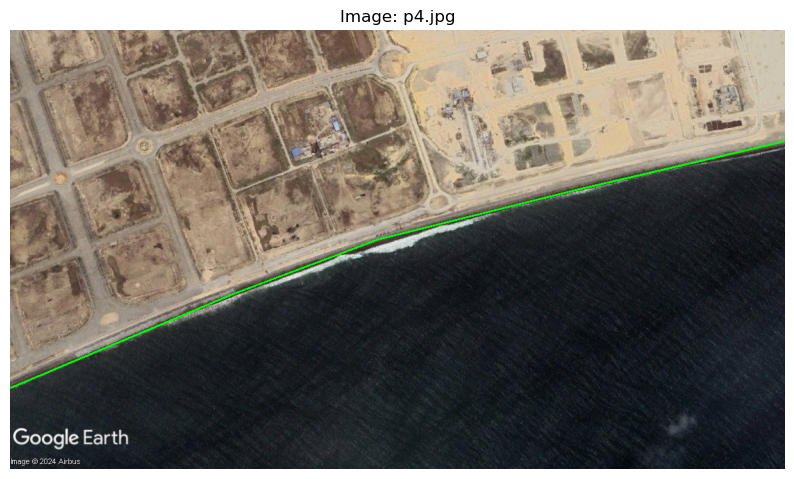

...

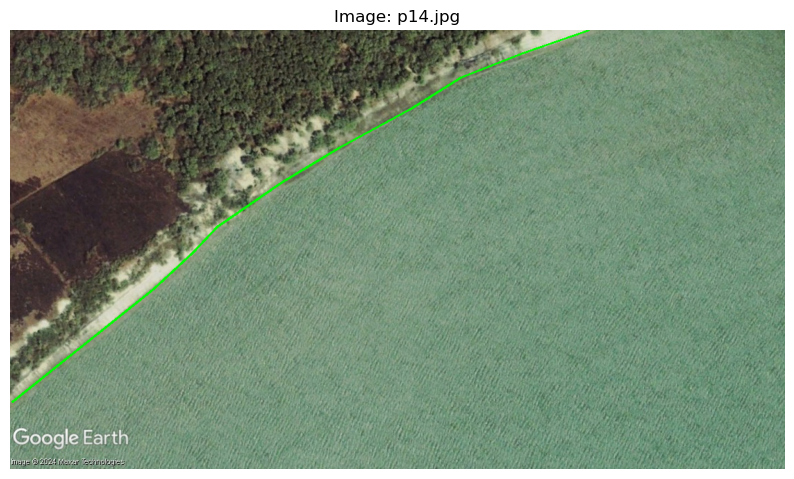

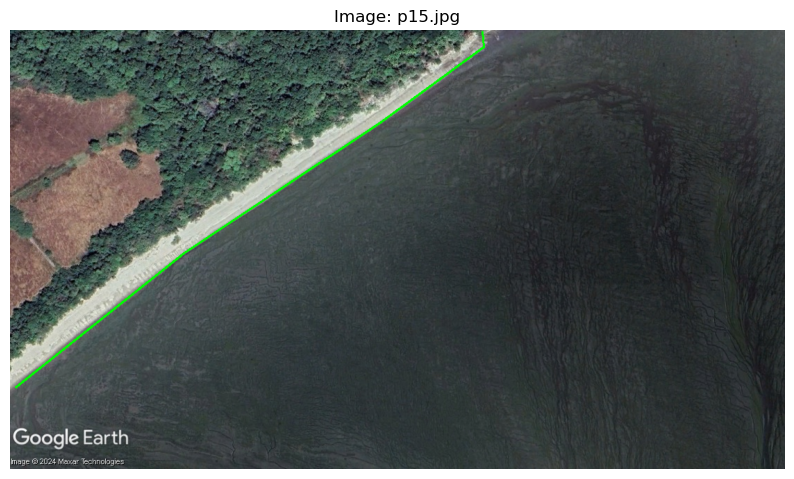

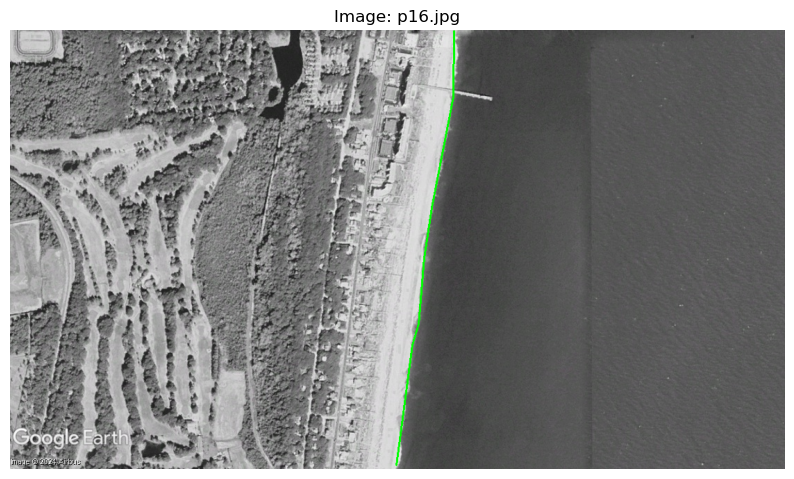

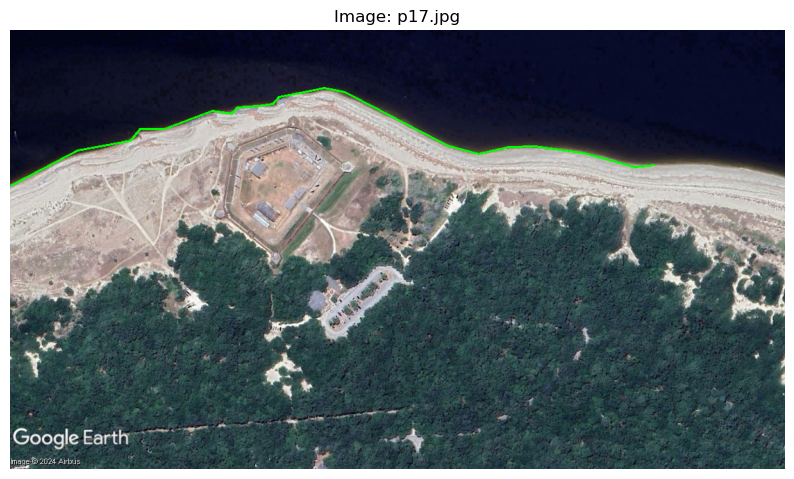

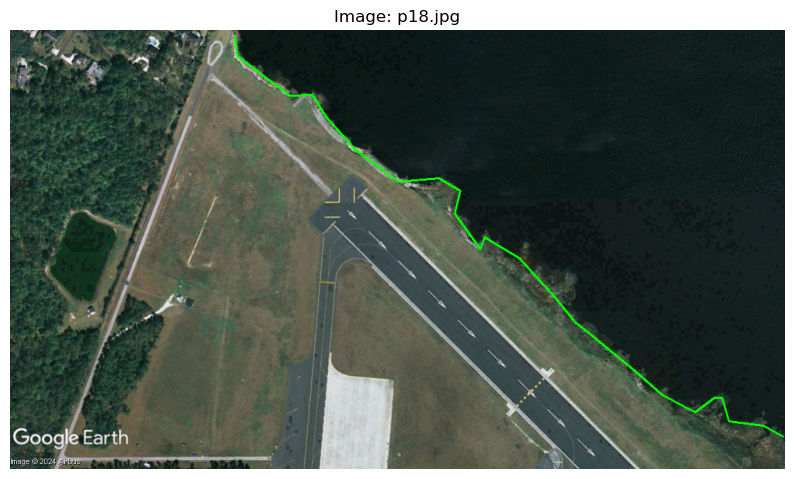

In [12]:
import cv2
import os

# Paths to your files
images_folder = "C:/Users/ThinkPad/Pictures/Shore_"  # Folder containing the images
coco_file = "annotations_coco.json"  # COCO or JSON file

# Load the COCO or JSON data
with open(coco_file, "r") as file:
    data = json.load(file)

# Extract annotations and images
images = {img['id']: img for img in data['images']}
annotations = data['annotations']

# Function to draw polylines on images
def draw_polylines(image_path, polylines):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not load image: {image_path}")
        return None
    
    # Convert to RGB for Matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Draw each polyline
    for polyline in polylines:
        points = [(int(polyline[i]), int(polyline[i + 1])) for i in range(0, len(polyline), 2)]
        for j in range(len(points) - 1):
            cv2.line(image, points[j], points[j + 1], color=(0, 255, 0), thickness=2)
    
    return image

# Loop through annotations and overlay polylines on respective images
for annotation in annotations:
    image_id = annotation['image_id']
    image_info = images.get(image_id)
    
    if not image_info:
        print(f"Image ID {image_id} not found in the dataset.")
        continue
    
    # Get the image file name and path
    image_path = os.path.join(images_folder, image_info['file_name'])
    
    # Get the polyline points (segmentation)
    if "segmentation" in annotation:
        polylines = annotation["segmentation"]
    else:
        print(f"No segmentation data for annotation ID {annotation['id']}.")
        continue
    
    # Draw polylines on the image
    output_image = draw_polylines(image_path, polylines)
    if output_image is not None:
        # Display the result
        plt.figure(figsize=(10, 10))
        plt.imshow(output_image)
        plt.title(f"Image: {image_info['file_name']}")
        plt.axis("off")
        plt.show()


In [14]:
output_folder = "shoreline_overlay"
os.makedirs(output_folder, exist_ok=True)

for annotation in annotations:
    image_id = annotation['image_id']
    image_info = images.get(image_id)
    image_path = os.path.join(images_folder, image_info['file_name'])
    
    if "segmentation" in annotation:
        polylines = annotation["segmentation"]
        output_image = draw_polylines(image_path, polylines)
        
        if output_image is not None:
            output_path = os.path.join(output_folder, image_info['file_name'])
            cv2.imwrite(output_path, cv2.cvtColor(output_image, cv2.COLOR_RGB2BGR))


In [6]:
# import json
# import os
# import numpy as np
# from PIL import Image, ImageDraw  # Import ImageDraw for drawing polygons
# from pycocotools.coco import COCO
# from pycocotools.mask import decode

# # Paths
# json_path = "annotations_coco.json"
# images_dir = "C:/Users/ThinkPad/Pictures/Shore_"  # Directory containing your images
# output_masks_dir = "masks"  # Directory to save generated masks

# # Create output directory if not exists
# os.makedirs(output_masks_dir, exist_ok=True)

# # Load COCO annotations
# with open(json_path, 'r') as f:
#     coco_data = json.load(f)

# # Initialize COCO
# coco = COCO(json_path)

# # Iterate through images
# for image_info in coco_data['images']:
#     image_id = image_info['id']
#     image_filename = image_info['file_name']
#     image_path = os.path.join(images_dir, image_filename)

#     # Open the image to get its dimensions
#     img = Image.open(image_path)
#     width, height = img.size

#     # Create an empty mask for this image
#     mask = np.zeros((height, width), dtype=np.uint8)

#     # Get annotations for this image
#     annotation_ids = coco.getAnnIds(imgIds=image_id)
#     annotations = coco.loadAnns(annotation_ids)

#     for annotation in annotations:
#         # Check if annotation has a segmentation
#         if 'segmentation' in annotation:
#             segmentation = annotation['segmentation']
            
#             # Handle polygons or RLE
#             if isinstance(segmentation, list):  # Polygon segmentation
#                 for poly in segmentation:
#                     # Draw polygon on the mask
#                     poly = np.array(poly).reshape((-1, 2))
#                     img_poly = Image.new('L', (width, height), 0)
#                     draw = ImageDraw.Draw(img_poly)  # Use ImageDraw to draw
#                     draw.polygon(list(map(tuple, poly)), outline=1, fill=1)
#                     mask = np.maximum(mask, np.array(img_poly))
#             else:  # RLE segmentation
#                 rle = annotation['segmentation']
#                 rle_mask = decode(rle)
#                 mask = np.maximum(mask, rle_mask)

#     # Save mask
#     mask_filename = os.path.splitext(image_filename)[0] + "_mask.png"
#     mask_path = os.path.join(output_masks_dir, mask_filename)
#     mask_image = Image.fromarray((mask * 255).astype(np.uint8))  # Scale mask to 0-255
#     mask_image.save(mask_path)

# print("Masks have been successfully generated!")

## INCREASE THICKNESS

In [35]:
# import json
# import os
# import numpy as np
# from PIL import Image, ImageDraw  # Import ImageDraw for drawing polygons
# from pycocotools.coco import COCO

# # Paths
# json_path = "annotations_coco.json"
# images_dir = "C:/Users/ThinkPad/Pictures/Shore_"  # Directory containing your images
# output_masks_dir = "masksxx"  # Directory to save polyline masks

# # Create output directory if not exist
# os.makedirs(output_masks_dir, exist_ok=True)

# # Load COCO annotations
# with open(json_path, 'r') as f:
#     coco_data = json.load(f)

# # Initialize COCO
# coco = COCO(json_path)

# # Iterate through images
# for image_info in coco_data['images']:
#     image_id = image_info['id']
#     image_filename = image_info['file_name']
#     image_path = os.path.join(images_dir, image_filename)

#     # Open the image to get its dimensions
#     img = Image.open(image_path)
#     width, height = img.size

#     # Create an empty mask image (mode 'L' for grayscale)
#     mask_img = Image.new('L', (width, height), 0)
#     draw = ImageDraw.Draw(mask_img)  # Use ImageDraw to draw on the mask image

#     # Get annotations for this image
#     annotation_ids = coco.getAnnIds(imgIds=image_id)
#     annotations = coco.loadAnns(annotation_ids)

#     for annotation in annotations:
#         # Check if annotation has a segmentation (polyline)
#         if 'segmentation' in annotation:
#             segmentation = annotation['segmentation']
            
#             # Handle polygons or RLE (if any)
#             if isinstance(segmentation, list):  # Polygon segmentation
#                 for poly in segmentation:
#                     # Draw polyline on the mask image with increased thickness
#                     poly = np.array(poly).reshape((-1, 2))
#                     draw.line(tuple(map(tuple, poly)), fill=255, width=30)  # Increased thickness to 30

#     # Save mask image
#     mask_filename = os.path.splitext(image_filename)[0] + "_polyline_mask.png"
#     mask_path = os.path.join(output_masks_dir, mask_filename)
#     mask_img.save(mask_path)

# print("Polyline masks with further increased thickness have been successfully generated and saved!")


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Polyline masks with further increased thickness have been successfully generated and saved!


In [ ]:
# import os
# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import img_to_array, array_to_img, ImageDataGenerator
# from PIL import Image
# import numpy as np

# # Paths
# images_dir = "C:/Users/ThinkPad/Pictures/Shore_"  # Replace with your images directory
# masks_dir = "poly_masks"    # Replace with your masks directory
# augmented_images_dir = "augmented_images"  # Directory to save augmented images
# augmented_masks_dir = "augmented_masks"    # Directory to save augmented masks

# # Create output directories if not exist
# os.makedirs(augmented_images_dir, exist_ok=True)
# os.makedirs(augmented_masks_dir, exist_ok=True)

# # Function to load images and masks
# def load_image_and_mask(image_path, mask_path):
#     image = Image.open(image_path)
#     mask = Image.open(mask_path)
#     return img_to_array(image), img_to_array(mask)

# # Function to save augmented images and masks
# def save_augmented_images_and_masks(images, masks, base_filename, count):
#     for i, (aug_img, aug_mask) in enumerate(zip(images, masks)):
#         img_filename = f"{base_filename}_aug_{i + count}.png"
#         mask_filename = f"{base_filename}_mask_aug_{i + count}.png"
#         array_to_img(aug_img).save(os.path.join(augmented_images_dir, img_filename))
#         array_to_img(aug_mask).save(os.path.join(augmented_masks_dir, mask_filename))

# # Augmentation parameters
# image_datagen = ImageDataGenerator(
#     horizontal_flip=True,
#     vertical_flip=True,
#     rotation_range=30,
#     brightness_range=(0.8, 1.2),
#     zoom_range=0.2,
#     shear_range=0.2
# )

# mask_datagen = ImageDataGenerator(
#     horizontal_flip=True,
#     vertical_flip=True,
#     rotation_range=30,
#     zoom_range=0.2,
#     shear_range=0.2
# )

# # Process each image-mask pair
# image_filenames = os.listdir(images_dir)
# mask_filenames = os.listdir(masks_dir)

# count = 0
# for img_file, mask_file in zip(image_filenames, mask_filenames):
#     # Ensure the image and mask match
#     if os.path.splitext(img_file)[0] != os.path.splitext(mask_file)[0]:
#         print(f"Skipping unmatched pair: {img_file}, {mask_file}")
#         continue

#     # Load image and mask
#     img_path = os.path.join(images_dir, img_file)
#     mask_path = os.path.join(masks_dir, mask_file)
#     image, mask = load_image_and_mask(img_path, mask_path)

#     # Expand dimensions for augmentation
#     image = np.expand_dims(image, axis=0)
#     mask = np.expand_dims(mask, axis=0)

#     # Set seed for consistent transformations
#     seed = np.random.randint(1000)
#     image_gen = image_datagen.flow(image, batch_size=1, seed=seed)
#     mask_gen = mask_datagen.flow(mask, batch_size=1, seed=seed)

#     # Generate augmented data
#     for _ in range(5):  # Generate 5 augmentations per image
#         aug_image = next(image_gen)[0]
#         aug_mask = next(mask_gen)[0]
#         save_augmented_images_and_masks(
#             [aug_image], [aug_mask], os.path.splitext(img_file)[0], count
#         )
#         count += 1

# print("Data augmentation completed successfully!")

## Resize and Save

In [37]:
# import os
# import cv2

# def resize_and_save_images(image_dir, mask_dir, output_image_dir, output_mask_dir, size=(512, 512)):

#     # Create output directories if they do not exist
#     os.makedirs(output_image_dir, exist_ok=True)
#     os.makedirs(output_mask_dir, exist_ok=True)

#     # Get sorted lists of filenames
#     image_files = sorted(os.listdir(image_dir))
#     mask_files = sorted(os.listdir(mask_dir))
    
#     # Ensure filenames match
#     if len(image_files) != len(mask_files):
#         raise ValueError("Number of images and masks do not match!")

#     for img_file, mask_file in zip(image_files, mask_files):
#         # Build full paths
#         img_path = os.path.join(image_dir, img_file)
#         mask_path = os.path.join(mask_dir, mask_file)

#         # Read the image and mask
#         image = cv2.imread(img_path)
#         mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

#         if image is None or mask is None:
#             print(f"Warning: Could not load {img_path} or {mask_path}. Skipping...")
#             continue

#         # Resize the image and mask
#         resized_image = cv2.resize(image, size)
#         resized_mask = cv2.resize(mask, size)

#         # Save resized image and mask
#         cv2.imwrite(os.path.join(output_image_dir, img_file), resized_image)
#         cv2.imwrite(os.path.join(output_mask_dir, mask_file), resized_mask)

#     print("Resizing and saving completed!")

# # Example usage
# image_dir = "C:/Users/ThinkPad/Pictures/Shore_"
# mask_dir = "masks"
# output_image_dir = "resized_images"
# output_mask_dir = "resized_masks"

# resize_and_save_images(image_dir, mask_dir, output_image_dir, output_mask_dir)


Resizing and saving completed!


## Data Aug

In [41]:
# Data Augumentation

import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img, ImageDataGenerator
from PIL import Image
import numpy as np

# Paths
images_dir = "resized_images"  # Replace with your images directory
masks_dir = "resized_masks"    # Replace with your masks directory
augmented_images_dir = "augmented_images"  # Directory to save augmented images
augmented_masks_dir = "augmented_masks"    # Directory to save augmented masks

# Create output directories if not exist
os.makedirs(augmented_images_dir, exist_ok=True)
os.makedirs(augmented_masks_dir, exist_ok=True)

# Function to load images and masks
def load_image_and_mask(image_path, mask_path):
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    return img_to_array(image), img_to_array(mask)

# Function to save augmented images and masks
def save_augmented_images_and_masks(images, masks, base_filename, count):
    for i, (aug_img, aug_mask) in enumerate(zip(images, masks)):
        img_filename = f"{base_filename}_aug_{i + count}.png"
        mask_filename = f"{base_filename}_mask_aug_{i + count}.png"
        array_to_img(aug_img).save(os.path.join(augmented_images_dir, img_filename))
        array_to_img(aug_mask).save(os.path.join(augmented_masks_dir, mask_filename))

# Augmentation parameters
image_datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=30,
    brightness_range=(0.8, 1.2),
    zoom_range=0.2,
    shear_range=0.1
)

mask_datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=30,
    zoom_range=0.2,
    shear_range=0.1
)

# Process each image-mask pair
image_filenames = os.listdir(images_dir)
mask_filenames = os.listdir(masks_dir)

count = 0
for img_file in image_filenames:
    # Find the best matching mask for the current image
    matching_masks = [
        mask_file for mask_file in mask_filenames
        if os.path.splitext(img_file)[0] in mask_file or os.path.splitext(mask_file)[0] in img_file
    ]

    if not matching_masks:
        print(f"Skipping unmatched image: {img_file}")
        continue

    # Use the first matching mask
    mask_file = matching_masks[0]
    img_path = os.path.join(images_dir, img_file)
    mask_path = os.path.join(masks_dir, mask_file)

    # Load image and mask
    image, mask = load_image_and_mask(img_path, mask_path)

    # Expand dimensions for augmentation
    image = np.expand_dims(image, axis=0)
    mask = np.expand_dims(mask, axis=0)

    # Set seed for consistent transformations
    seed = np.random.randint(1000)
    image_gen = image_datagen.flow(image, batch_size=1, seed=seed)
    mask_gen = mask_datagen.flow(mask, batch_size=1, seed=seed)

    # Generate augmented data
    for _ in range(5):  # Generate 5 augmentations per image
        aug_image = next(image_gen)[0]
        aug_mask = next(mask_gen)[0]
        save_augmented_images_and_masks(
            [aug_image], [aug_mask], os.path.splitext(img_file)[0], count
        )
        count += 1

print("Data augmentation completed successfully!")

Data augmentation completed successfully!


## Split Data

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

def split_and_organize_data(image_dir, mask_dir, output_dir, test_size=0.2, random_state=42):

    # Get sorted lists of filenames
    image_files = sorted(os.listdir(image_dir))
    mask_files = sorted(os.listdir(mask_dir))

    # Ensure the number of images and masks match
    if len(image_files) != len(mask_files):
        raise ValueError("Number of images and masks do not match!")

    # Split the dataset into training and testing sets
    train_images, test_images, train_masks, test_masks = train_test_split(
        image_files, mask_files, test_size=test_size, random_state=random_state
    )

    # Define subdirectories for training and testing
    train_image_dir = os.path.join(output_dir, 'train', 'images')
    train_mask_dir = os.path.join(output_dir, 'train', 'masks')
    test_image_dir = os.path.join(output_dir, 'test', 'images')
    test_mask_dir = os.path.join(output_dir, 'test', 'masks')

    # Create directories if they don't exist
    os.makedirs(train_image_dir, exist_ok=True)
    os.makedirs(train_mask_dir, exist_ok=True)
    os.makedirs(test_image_dir, exist_ok=True)
    os.makedirs(test_mask_dir, exist_ok=True)

    # Helper function to copy files
    def copy_files(file_list, src_dir, dest_dir):
        for file_name in file_list:
            src_path = os.path.join(src_dir, file_name)
            dest_path = os.path.join(dest_dir, file_name)
            shutil.copy(src_path, dest_path)

    # Copy training files
    copy_files(train_images, image_dir, train_image_dir)
    copy_files(train_masks, mask_dir, train_mask_dir)

    # Copy testing files
    copy_files(test_images, image_dir, test_image_dir)
    copy_files(test_masks, mask_dir, test_mask_dir)

    print(f"Data organized into {output_dir} with training and testing sets.")

# Example usage
image_dir = 'augmented_images'
mask_dir = 'augmented_masks'
output_dir = 'split_data'

split_and_organize_data(image_dir, mask_dir, output_dir)
